In [1]:
import os
import pandas as pd
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
os.listdir()

['.ipynb_checkpoints',
 'sample_submission.csv.zip',
 'test.csv.zip',
 'train',
 'train.csv.zip',
 'Untitled.ipynb']

In [2]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import explained_variance_score,mean_absolute_error
file="C:/Users/faiza/OneDrive/Desktop/Springboard/Capstone_Project/mercedes-benz-greener-manufacturing/train/train.csv"
df=pd.read_csv(file)
#pd.set_option('display.max_rows', None)
#pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [3]:
df.head()

,ID,y,X0,X1,X2,X3,X4,X5,X6,X8,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
0,0,130.81,k,v,at,a,d,u,j,o,...,0,0,1,0,0,0,0,0,0,0
1,6,88.53,k,t,av,e,d,y,l,o,...,1,0,0,0,0,0,0,0,0,0
2,7,76.26,az,w,n,c,d,x,j,x,...,0,0,0,0,0,0,1,0,0,0
3,9,80.62,az,t,n,f,d,x,l,e,...,0,0,0,0,0,0,0,0,0,0
4,13,78.02,az,v,n,f,d,h,d,n,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df

,ID,y,X0,X1,X2,X3,X4,X5,X6,X8,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385
0,0,130.81,k,v,at,a,d,u,j,o,...,0,0,1,0,0,0,0,0,0,0
1,6,88.53,k,t,av,e,d,y,l,o,...,1,0,0,0,0,0,0,0,0,0
2,7,76.26,az,w,n,c,d,x,j,x,...,0,0,0,0,0,0,1,0,0,0
3,9,80.62,az,t,n,f,d,x,l,e,...,0,0,0,0,0,0,0,0,0,0
4,13,78.02,az,v,n,f,d,h,d,n,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4204,8405,107.39,ak,s,as,c,d,aa,d,q,...,1,0,0,0,0,0,0,0,0,0
4205,8406,108.77,j,o,t,d,d,aa,h,h,...,0,1,0,0,0,0,0,0,0,0
4206,8412,109.22,ak,v,r,a,d,aa,g,e,...,0,0,1,0,0,0,0,0,0,0
4207,8415,87.48,al,r,e,f,d,aa,l,u,...,0,0,0,0,0,0,0,0,0,0


In [5]:
df.shape

(4209, 378)

As it can be seen above there are 4209 observations and 378 Features in the training set. 

In [6]:
vo = pd.DataFrame(df.dtypes).reset_index()
vo.columns = ['VarName', 'DType']
vo

,VarName,DType
0,ID,int64
1,y,float64
2,X0,object
3,X1,object
4,X2,object
...,...,...
373,X380,int64
374,X382,int64
375,X383,int64
376,X384,int64


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4209 entries, 0 to 4208
Columns: 378 entries, ID to X385
dtypes: float64(1), int64(369), object(8)
memory usage: 12.1+ MB


As inferred from the info function there are 8 Categorical Features and 370 Numerical Features

In [8]:
# Counting the unique values in every coloumn
df.nunique()

ID      4209
y       2545
X0        47
X1        27
X2        44
        ... 
X380       2
X382       2
X383       2
X384       2
X385       2
Length: 378, dtype: int64

In [9]:
#Print the percent of unique values per column.Use the df.nunique and the size of the dataframe to calculate the percentages
print(df.nunique()/df.shape[0])

ID      1.000000
y       0.604657
X0      0.011167
X1      0.006415
X2      0.010454
          ...   
X380    0.000475
X382    0.000475
X383    0.000475
X384    0.000475
X385    0.000475
Length: 378, dtype: float64


Print the minimum and maximum values of each column using the aggregate function

In [10]:
df.agg([min, max]).T

,min,max
ID,0,8417
y,72.11,265.32
X0,a,z
X1,a,z
X2,a,z
...,...,...
X380,0,1
X382,0,1
X383,0,1
X384,0,1


Reviewing the numeric data sets summary statistics.

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,4209.0,4205.960798,2437.608688,0.00,2095.00,4220.00,6314.00,8417.00
y,4209.0,100.669318,12.679381,72.11,90.82,99.15,109.01,265.32
X10,4209.0,0.013305,0.114590,0.00,0.00,0.00,0.00,1.00
X11,4209.0,0.000000,0.000000,0.00,0.00,0.00,0.00,0.00
X12,4209.0,0.075077,0.263547,0.00,0.00,0.00,0.00,1.00
...,...,...,...,...,...,...,...,...
X380,4209.0,0.008078,0.089524,0.00,0.00,0.00,0.00,1.00
X382,4209.0,0.007603,0.086872,0.00,0.00,0.00,0.00,1.00
X383,4209.0,0.001663,0.040752,0.00,0.00,0.00,0.00,1.00
X384,4209.0,0.000475,0.021796,0.00,0.00,0.00,0.00,1.00


In [12]:
# https://www.kaggle.com/sudalairajkumar/simple-exploration-notebook-mercedes/notebook
unique_values_dict = {}
for col in df.columns:
    if col not in ["ID", "y", "X0", "X1", "X2", "X3", "X4", "X5", "X6", "X8"]:
        unique_value = str(np.sort(df[col].unique()).tolist())
        tlist = unique_values_dict.get(unique_value, [])
        tlist.append(col)
        unique_values_dict[unique_value] = tlist[:]
for unique_val, columns in unique_values_dict.items():
    print("Columns containing the unique values : ",unique_val)
    print(columns)
    print("--------------------------------------------------")

Columns containing the unique values :  [0, 1]
['X10', 'X12', 'X13', 'X14', 'X15', 'X16', 'X17', 'X18', 'X19', 'X20', 'X21', 'X22', 'X23', 'X24', 'X26', 'X27', 'X28', 'X29', 'X30', 'X31', 'X32', 'X33', 'X34', 'X35', 'X36', 'X37', 'X38', 'X39', 'X40', 'X41', 'X42', 'X43', 'X44', 'X45', 'X46', 'X47', 'X48', 'X49', 'X50', 'X51', 'X52', 'X53', 'X54', 'X55', 'X56', 'X57', 'X58', 'X59', 'X60', 'X61', 'X62', 'X63', 'X64', 'X65', 'X66', 'X67', 'X68', 'X69', 'X70', 'X71', 'X73', 'X74', 'X75', 'X76', 'X77', 'X78', 'X79', 'X80', 'X81', 'X82', 'X83', 'X84', 'X85', 'X86', 'X87', 'X88', 'X89', 'X90', 'X91', 'X92', 'X94', 'X95', 'X96', 'X97', 'X98', 'X99', 'X100', 'X101', 'X102', 'X103', 'X104', 'X105', 'X106', 'X108', 'X109', 'X110', 'X111', 'X112', 'X113', 'X114', 'X115', 'X116', 'X117', 'X118', 'X119', 'X120', 'X122', 'X123', 'X124', 'X125', 'X126', 'X127', 'X128', 'X129', 'X130', 'X131', 'X132', 'X133', 'X134', 'X135', 'X136', 'X137', 'X138', 'X139', 'X140', 'X141', 'X142', 'X143', 'X144', 'X145'

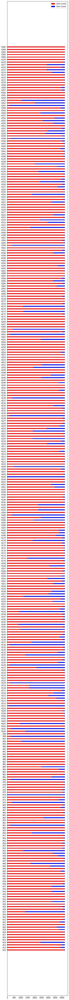

In [13]:
# https://www.kaggle.com/sudalairajkumar/simple-exploration-notebook-mercedes/notebook
zero_count_list = []
one_count_list = []
cols_list = unique_values_dict['[0, 1]']
for col in cols_list:
    zero_count_list.append((df[col]==0).sum())
    one_count_list.append((df[col]==1).sum())

N = len(cols_list)
ind = np.arange(N)
width = 0.35

plt.figure(figsize=(6,100))
p1 = plt.barh(ind, zero_count_list, width, color='red')
p2 = plt.barh(ind, one_count_list, width, left=zero_count_list, color="blue")
plt.yticks(ind, cols_list)
plt.legend((p1[0], p2[0]), ('Zero count', 'One Count'))
plt.show()

From the above plot, we observed that, there are many variables which have very low variance.
There are features also, which have constant values.

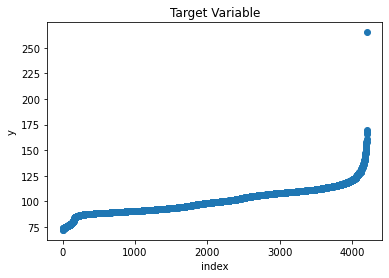

In [14]:
plt.scatter(range(df.shape[0]),np.sort(df["y"]))
plt.title("Target Variable")
plt.xlabel("index")
plt.ylabel("y")
plt.show()

In [15]:
df_modified = df[df["y"]<170]

In [16]:
df.X4.value_counts().to_frame()

,X4
d,4205
a,2
b,1
c,1


The X4 column contain majority 'd' values , later on in our analysis we can drop this column

In [17]:
nas=pd.DataFrame(df.isnull().sum().sort_values(ascending=False)/len(df),columns = ['percent'])
pos = nas['percent'] > 0
nas[pos]

,percent


As seen above our dataset is clean and has no missing values

In [18]:
df.isnull().sum()

ID      0
y       0
X0      0
X1      0
X2      0
       ..
X380    0
X382    0
X383    0
X384    0
X385    0
Length: 378, dtype: int64

<AxesSubplot:>

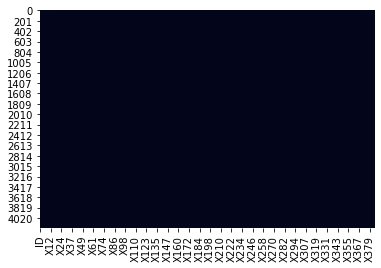

In [19]:
sns.heatmap(df.isnull(), cbar=False)

Looking for any Duplicate rows in the dataset

In [20]:
duplicateRowsDF = df[df.duplicated()]
duplicateRowsDF


,ID,y,X0,X1,X2,X3,X4,X5,X6,X8,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385


There are no duplicate rows found in the dataset

In [21]:
duplicate_columns = list(df_modified.T.index[df_modified.T.duplicated(keep="first")].values)
duplicate_columns

['X35',
 'X37',
 'X39',
 'X76',
 'X84',
 'X93',
 'X94',
 'X102',
 'X107',
 'X113',
 'X119',
 'X122',
 'X134',
 'X146',
 'X147',
 'X172',
 'X199',
 'X213',
 'X214',
 'X216',
 'X222',
 'X226',
 'X227',
 'X232',
 'X233',
 'X235',
 'X239',
 'X242',
 'X243',
 'X244',
 'X245',
 'X247',
 'X248',
 'X253',
 'X254',
 'X262',
 'X266',
 'X268',
 'X279',
 'X289',
 'X290',
 'X293',
 'X296',
 'X297',
 'X299',
 'X302',
 'X320',
 'X324',
 'X326',
 'X330',
 'X347',
 'X360',
 'X364',
 'X365',
 'X382',
 'X385']

In [22]:
Variance = []
Variance.extend(duplicate_columns)

In [23]:
print("No of duplicate columns is",len(duplicate_columns))

No of duplicate columns is 56


Finding features with min variance

In [24]:
#https://github.com/aditya2029/Mercedes-Benz-Greener-Manufacturer/blob/master/mercedes%20greener%20manufacturer_final_updated.ipynb
df_num = df_modified.loc[:,df_modified.dtypes==np.int64]
temp = []
for i in df_num.columns:
    if df_modified[i].var()==0:
        temp.append(i)
        
print(len(temp))
print(temp)
    

12
['X11', 'X93', 'X107', 'X233', 'X235', 'X268', 'X289', 'X290', 'X293', 'X297', 'X330', 'X347']


In [25]:
#https://github.com/aditya2029/Mercedes-Benz-Greener-Manufacturer/blob/master/mercedes%20greener%20manufacturer_final_updated.ipynb
Variance.extend(temp)
Variance = list(set(Variance))
Variance.append("X4")
print(df_modified.shape)
df_modified = df_modified.drop(Variance, axis=1)
print(df_modified.shape)

(4208, 378)
(4208, 320)


In [26]:
print("Number of removed features: ",df.shape[1] - df_modified.shape[1])

Number of removed features:  58


In [27]:
Y_train = df_modified["y"]

In [28]:
df_modified.drop(columns=["y"], axis=1, inplace=True)
X_train = df_modified

In [29]:
df_modified.shape

(4208, 319)

Categorical Variables Analysis

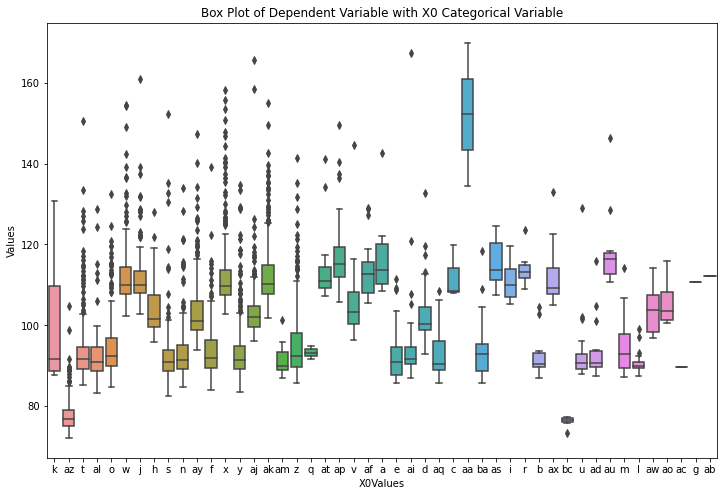

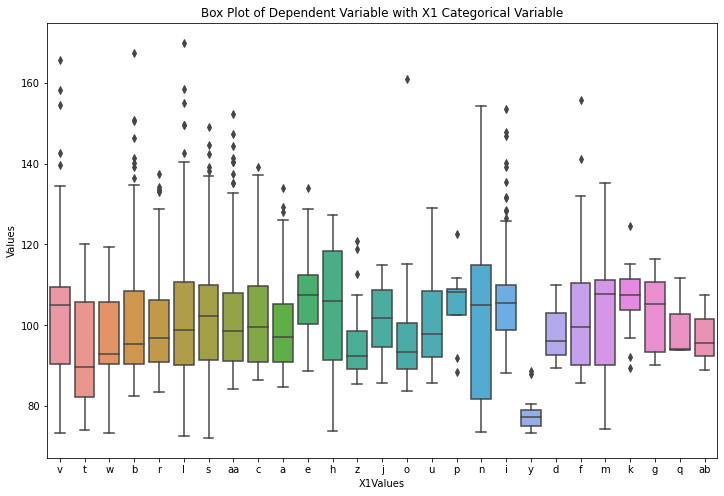

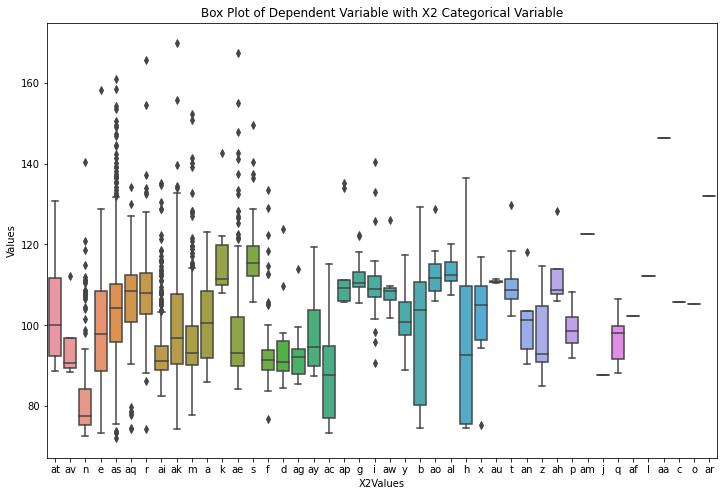

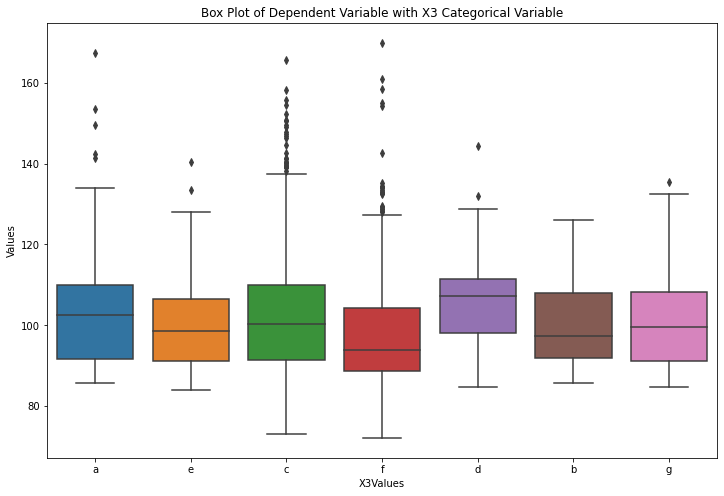

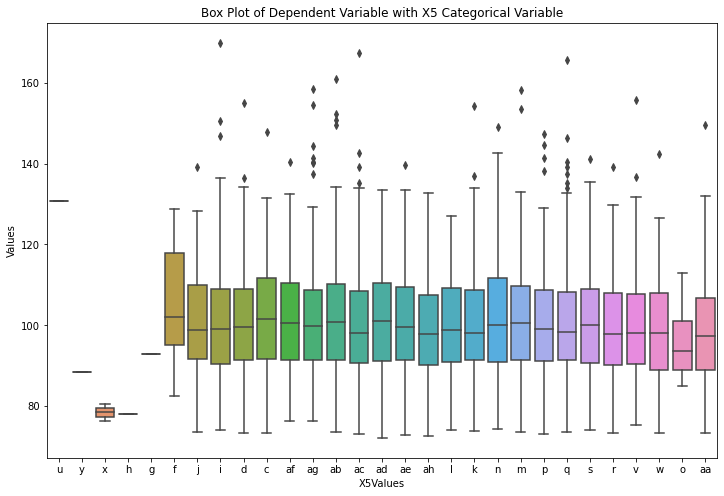

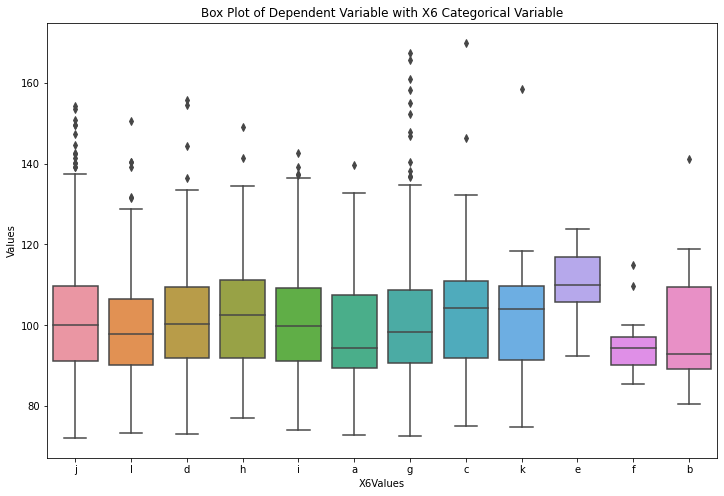

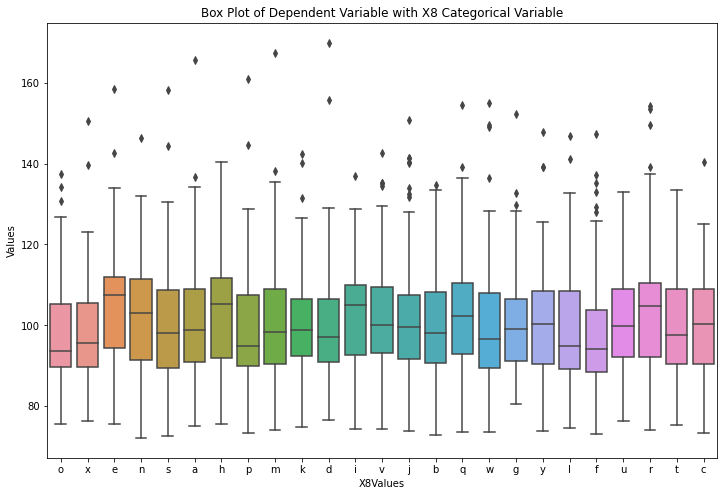

In [30]:
#https://github.com/aditya2029/Mercedes-Benz-Greener-Manufacturer/blob/master/mercedes%20greener%20manufacturer_final_updated.ipynb
for i in list(df_modified.columns):
    if(df_modified[i].dtypes==np.object):
        plt.figure(figsize=(12,8))
        sns.boxplot(y=Y_train,x=df_modified[i])
        plt.xlabel(i + "Values")
        plt.ylabel("Values")
        plt.title("Box Plot of Dependent Variable with "+ i + " Categorical Variable")

Histograms are an excellent way to review the range and density of values for each numeric features in our data set and build data profiles. 

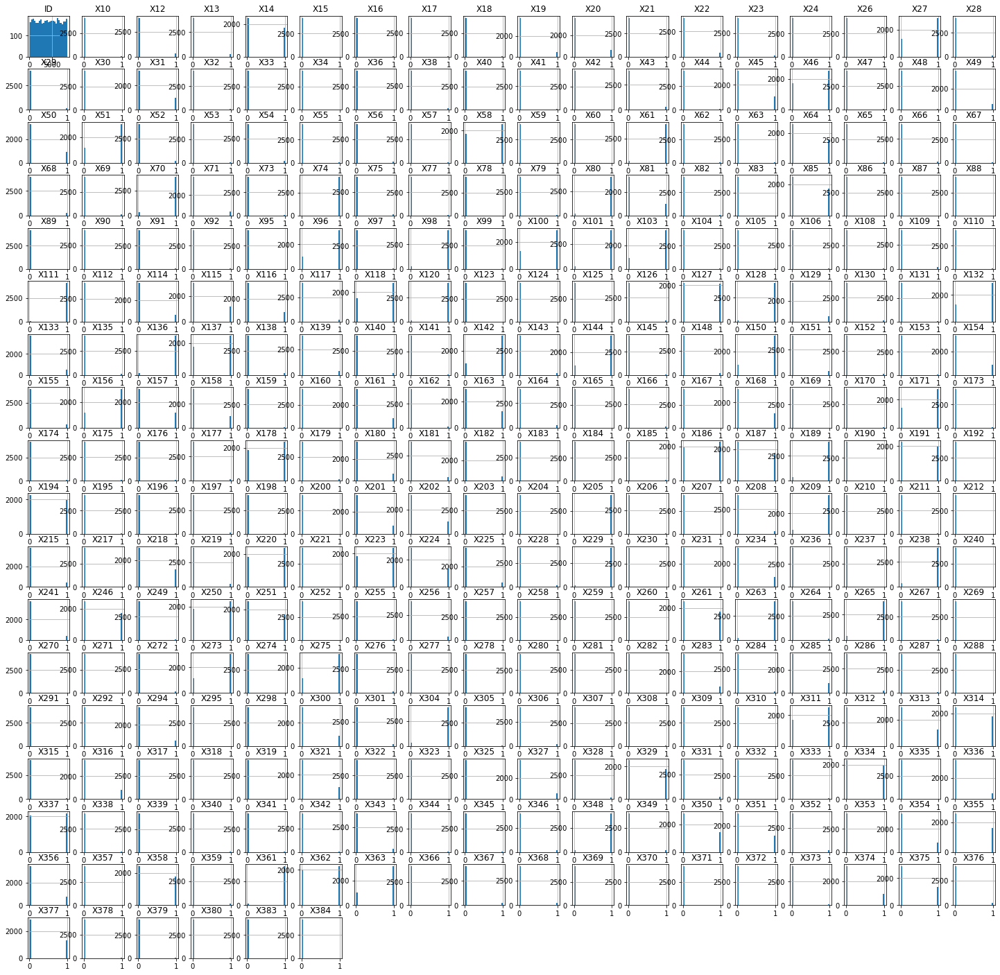

In [31]:
hist = df_modified.hist(bins=25,figsize =(25,25))

In [34]:
df_corr = df_modified
df_corr['y'] =Y_train
df_corr.head()

,ID,X0,X1,X2,X3,X5,X6,X8,X10,X12,...,X374,X375,X376,X377,X378,X379,X380,X383,X384,y
0,0,k,v,at,a,u,j,o,0,0,...,0,0,0,1,0,0,0,0,0,130.81
1,6,k,t,av,e,y,l,o,0,0,...,0,1,0,0,0,0,0,0,0,88.53
2,7,az,w,n,c,x,j,x,0,0,...,0,0,0,0,0,0,0,0,0,76.26
3,9,az,t,n,f,x,l,e,0,0,...,0,0,0,0,0,0,0,0,0,80.62
4,13,az,v,n,f,h,d,n,0,0,...,0,0,0,0,0,0,0,0,0,78.02


Creating a Pearson correlation heatmap

In [35]:

corr = df_corr.corr()
corr.round(2).style.background_gradient(cmap='coolwarm')

In [ ]:
#pair plots
g =sns.pairplot(df_corr)